In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import geopandas as gpd
from shapely.geometry import Point, Polygon
import scipy.stats as stats
from sklearn.preprocessing import LabelBinarizer
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pingouin as pg
from statsmodels.stats.descriptivestats import describe

Initialising the data and its outputs were deleted as it contained sensitive info

In [12]:
#Commonly used df
ep_df = working_df[working_df.SiteOfDisease == 'Extra Pulmonary']
p_df = working_df[working_df.SiteOfDisease == 'Pulmonary']

EP_SITES = ['Abdominal', 'Pleural', 'Spinal', 'Lymph Node']
assert len(ep_df) != 0
assert len(p_df) != 0

# Helper Functions

In [14]:
def get_sample(gender, bmi, dm, hiv):
  _df = pd.DataFrame()
  age = np.arange(1,100,1)
  _df['Age'] = np.arange(1,100,1)
  _df['bmi'] = np.full(age.shape, bmi)
  _df['Gender'] = np.full(age.shape, gender)
  _df['dm'] = np.full(age.shape, dm)
  intercept = np.full(age.shape, 1)
  if isinstance(hiv, int): 
    _df['hiv'] = np.full(age.shape, hiv)
    # X = np.array([intercept, age, gender, bmi, dm, hiv]).T
  else:
    pass
    # X = np.array([intercept, age, gender, bmi, dm]).T
  return sm.add_constant(_df)

In [15]:
def plot_regression(result):
  SHRINK = 0.7
  HIV = 0
  age = np.arange(1,100)
  bmi = np.linspace(15,30,99)
  xx, yy = np.meshgrid(age, bmi)
  w = np.zeros((99,99))
  FIGSIZE = (15,5)
  fig, ax = plt.subplots(1,3,figsize =FIGSIZE, sharex=True, sharey=True, dpi = 600)

  for i, b in enumerate(bmi):
    # print(i)
    y = result.predict(get_sample(0,b, 0, HIV))
    w[i] = y
  g= ax[0].contourf(xx,yy,w, cmap = cm.inferno, )
  fig.colorbar(g, ax = ax[0], shrink = SHRINK, )
  _w = w.copy()
  for i, b in enumerate(bmi):
    y = result.predict(get_sample(1,b, 0, HIV))
    w[i] = y
  g = ax[1].contourf(xx,yy,w, cmap = cm.inferno, )
  ax[0].set_title('Male')
  ax[1].set_title('Female')
  ax[2].set_title('Difference between probabilities of Female and Male')
  fig.colorbar(g, ax = ax[1], shrink = SHRINK ,)
  g = ax[2].contourf(xx,yy, w - _w, cmap = cm.inferno, )
  fig.colorbar(g, ax = ax[2], shrink = SHRINK ,)
  plt.setp(ax, xlabel = 'Age', ylabel = 'BMI')
  fig.suptitle('Effect of gender along with age and bmi on EPTB probability')
  # fig.savefig('Figure 2.jpg', dpi = 600, transparent=False, format = 'jpg')
  plt.show()

  fig, ax = plt.subplots(1,3, figsize = FIGSIZE, sharex=True, sharey=True, dpi = 600)

  for i, b in enumerate(bmi):
    y = result.predict(get_sample(0,b,0,HIV))
    w[i] = y

  _w = w.copy()
  g = ax[0].contourf(xx,yy,w,cmap = cm.inferno, )
  fig.colorbar(g, ax = ax[0], shrink = SHRINK, )

  for i, b in enumerate(bmi):
    y = result.predict(get_sample(0,b,1,HIV))
    w[i] = y
  g = ax[1].contourf(xx,yy,w, cmap = cm.inferno, )
  fig.colorbar(g, ax = ax[1], shrink = SHRINK, )
  g = ax[2].contourf(xx,yy,_w - w, cmap = cm.inferno, )
  fig.colorbar(g, ax = ax[2], shrink = SHRINK ,)
  ax[1].set_title('Diabetic')
  ax[0].set_title('Non Diabetic')
  ax[2].set_title('Differene in probabilities of non-diabetic and diabetic')
  fig.suptitle('Effect of diabetes along with age and bmi on EPTB probability')
  plt.setp(ax, xlabel = 'Age', ylabel = 'BMI')
  # fig.savefig('Figure 3.jpg', dpi = 600, transparent=False, format = 'jpg')
  plt.show()

In [21]:
from matplotlib import cm
def plot_regression_3d(result):
  SHRINK = 0.5
  HIV = 0
  age = np.arange(1,100)
  bmi = np.linspace(15,30,99)
  xx, yy = np.meshgrid(age, bmi)
  w = np.zeros((99,99))
  fig, ax = plt.subplots(2,1,figsize = (10,15),subplot_kw = {'projection' :'3d'})

  for i, b in enumerate(bmi):
    # print(i)
    y = result.predict(get_sample(0,b, 0, HIV))
    w[i] = y
  g= ax[0].plot_surface(xx,yy,w, cmap = cm.Blues, label = 'Male')
  fig.colorbar(g, ax = ax[0], shrink = SHRINK, label = 'Male')

  for i, b in enumerate(bmi):
    y = result.predict(get_sample(1,b, 0, HIV))
    w[i] = y
  g = ax[0].plot_surface(xx,yy,w, cmap = 'Reds', label = 'Female')
  ax[0].set_title('Effect of Gender')
  ax[0].view_init(15,50)
  ax[0].set_xlabel('Age')
  ax[0].set_ylabel('BMI')

  ax[0].yaxis.set_major_formatter('{x}')
  ax[0].set_zlabel('Predicted Probability')
  fig.colorbar(g, ax = ax[0], shrink = SHRINK, label = 'Female')
  # ax[0].set_proj_type('persp')

  for i, b in enumerate(bmi):
    y = result.predict(get_sample(0,b,0,HIV))
    w[i] = y
  g = ax[1].plot_surface(xx,yy,w,cmap = cm.Greens, label = 'Non Diabetic')
  fig.colorbar(g, ax = ax[1], shrink = SHRINK, label = 'Non Diabetic')

  for i, b in enumerate(bmi):
    y = result.predict(get_sample(0,b,1,HIV))
    w[i] = y
  g = ax[1].plot_surface(xx,yy,w, cmap = cm.Reds, label = 'Diabetic')
  fig.colorbar(g, ax = ax[1], shrink = SHRINK, label = 'Diabetic')

  ax[1].set_title('Effect of Diabetes')
  ax[1].view_init(15,50)
  ax[1].set_xlabel('Age')
  ax[1].set_ylabel('BMI')
  ax[1].yaxis.set_major_formatter('{x}')
  ax[1].set_zlabel('Predicted Probability')
  # ax[1].set_proj_type('persp')
  plt.tight_layout()
  plt.show()

# Regression Analysis

Model with no interaction term. Plotting done through both contours and surfaces

Optimization terminated successfully.
         Current function value: 0.566131
         Iterations 6


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.066     
Dependent Variable: ep               AIC:              2858.5070 
Date:               2022-10-13 15:00 BIC:              2893.4847 
No. Observations:   2514             Log-Likelihood:   -1423.3   
Df Model:           5                LL-Null:          -1524.4   
Df Residuals:       2508             LLR p-value:      9.5212e-42
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     6.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept    -2.3549    0.2260  -10.4213  0.0000  -2.7978  -1.9120
Age          -0.0156    0.0027   -5.8200  0.0000  -0.0208  -0.0103
Gender        0.2443    0.0940    2.6002  0.0093   0.0602   0.4285
bmi           0.1091    0.0105   10.4109  0.0000   0.0886   0.1297
dm           -0.8338    0.1591   -5.2401  0.0000  -1.1457  -0.5220
hiv          -0.0063    0.4053   -0.0154  0.9877  -0.8005   0.7880
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.094905
Age          0.984546
Gender       1.276742
bmi          1.115322
dm           0.434379
hiv          0.993767
dtype: float64

,0,1
Intercept,0.060946,0.147786
Age,0.979396,0.989724
Gender,1.062002,1.534903
bmi,1.092639,1.138476
dm,0.317995,0.593359
hiv,0.449083,2.199086


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0030      0.001     -5.946      0.000      -0.004      -0.002
Gender         0.0467      0.018      2.612      0.009       0.012       0.082
bmi            0.0209      0.002     11.267      0.000       0.017       0.025
dm            -0.1595      0.030     -5.323      0.000      -0.218      -0.101
hiv           -0.0012      0.078     -0.015      0.988      -0.153       0.151
==============================================================================
"""

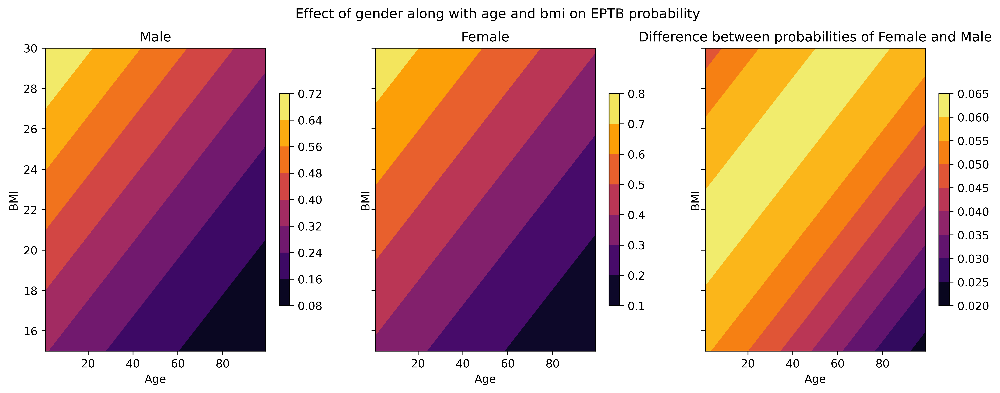

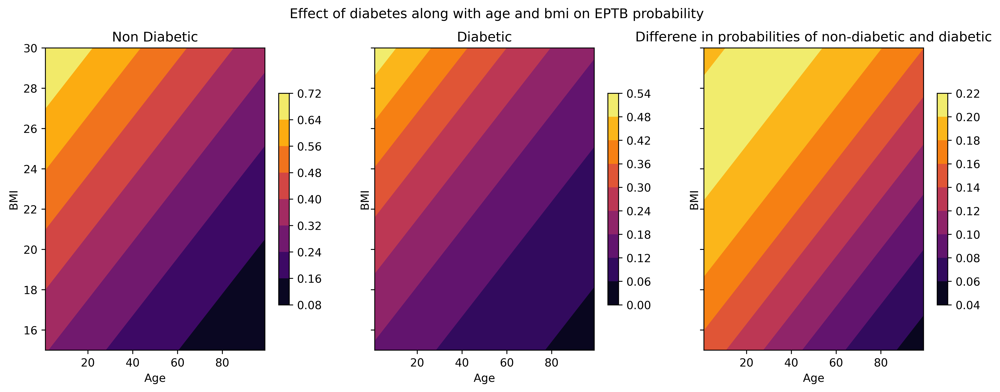

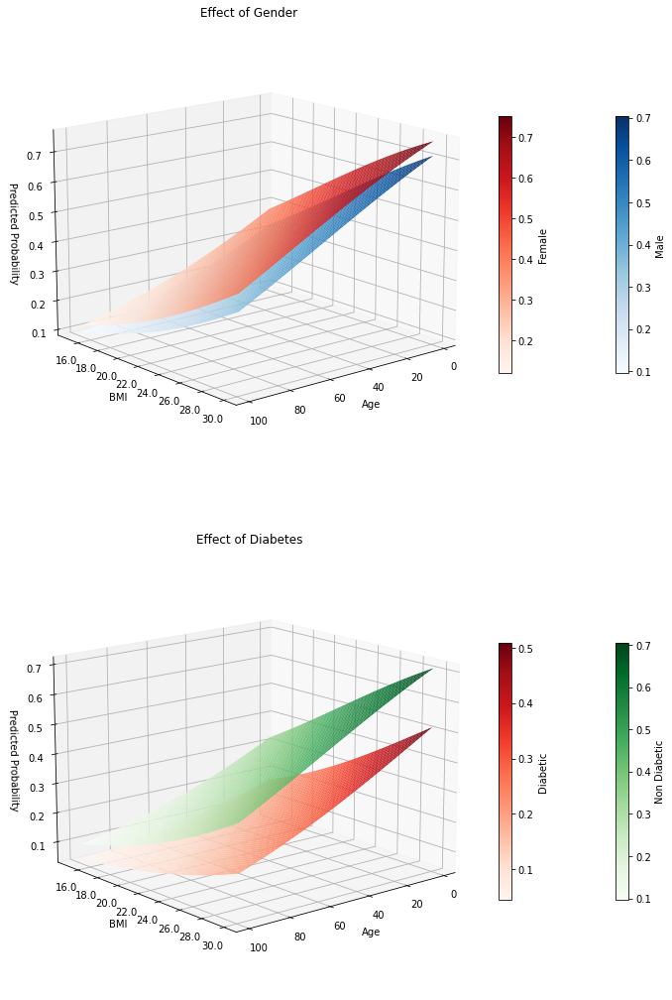

In [23]:
_df = working_df.loc[:, ['ep', 'Age', 'Gender', 'bmi', 'dm', 'hiv',]].dropna()
result = smf.logit('ep ~ Age + Gender + bmi + dm + hiv ', _df).fit()
# result_plot = sm.Logit(_df.ep, sm.add_constant(_df.loc[:,['Age', 'Gender', 'bmi', 'dm', 'hiv']]), missing = 'drop', ).fit()
display(result.summary2())
# display(result.conf_int)
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Odds ratios and confidence intervals')
display(np.exp(result.params))
display(np.exp(result.conf_int()))
marg_eff = result.get_margeff(at = 'overall', method = 'dydx')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
display(marg_eff.summary())
plot_regression(result)
plot_regression_3d(result)
# warnings.filterwarnings('ignore')

Model with interaction term between age and diabetes

Optimization terminated successfully.
         Current function value: 0.564680
         Iterations 6


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.069     
Dependent Variable: ep               AIC:              2853.2111 
Date:               2022-10-13 15:00 BIC:              2894.0185 
No. Observations:   2514             Log-Likelihood:   -1419.6   
Df Model:           6                LL-Null:          -1524.4   
Df Residuals:       2507             LLR p-value:      1.7867e-42
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     6.0000                                       
------------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept     -2.2716    0.2280  -9.9651  0.0000  -2.7184  -1.8248
Age           -0.0175    0.0028  -6.2777  0.0000  -0.0230  -0.0121
Gender         0.2329    0.0942   2.4726  0.0134   0.0483   0.4174
bmi            0.1089    0.0105  10.3795  0.0000   0.0883   0.1295
dm            -2.2724    0.5808  -3.9127  0.0001  -3.4108  -1.1341
hiv           -0.0134    0.4049  -0.0331  0.9736  -0.8070   0.7802
Age:dm         0.0285    0.0107   2.6670  0.0077   0.0076   0.0495
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.103150
Age          0.982606
Gender       1.262209
bmi          1.115045
dm           0.103060
hiv          0.986681
Age:dm       1.028945
dtype: float64

,0,1
Intercept,0.065983,0.161251
Age,0.977238,0.988004
Gender,1.049465,1.518079
bmi,1.092351,1.138210
dm,0.033016,0.321703
hiv,0.446194,2.181874
Age:dm,1.007593,1.050749


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0033      0.001     -6.439      0.000      -0.004      -0.002
Gender         0.0444      0.018      2.483      0.013       0.009       0.079
bmi            0.0208      0.002     11.226      0.000       0.017       0.024
dm            -0.4335      0.110     -3.944      0.000      -0.649      -0.218
hiv           -0.0026      0.077     -0.033      0.974      -0.154       0.149
Age:dm         0.0054      0.002      2.677      0.007       0.001       0.009
==============================================================================
"""

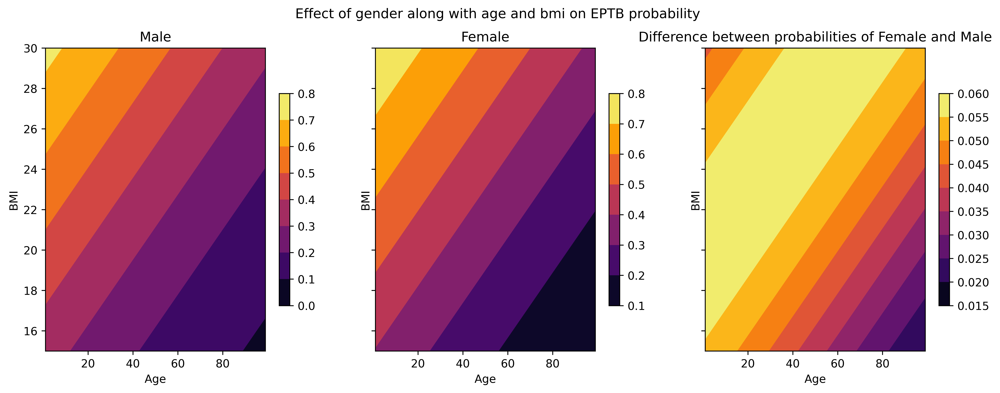

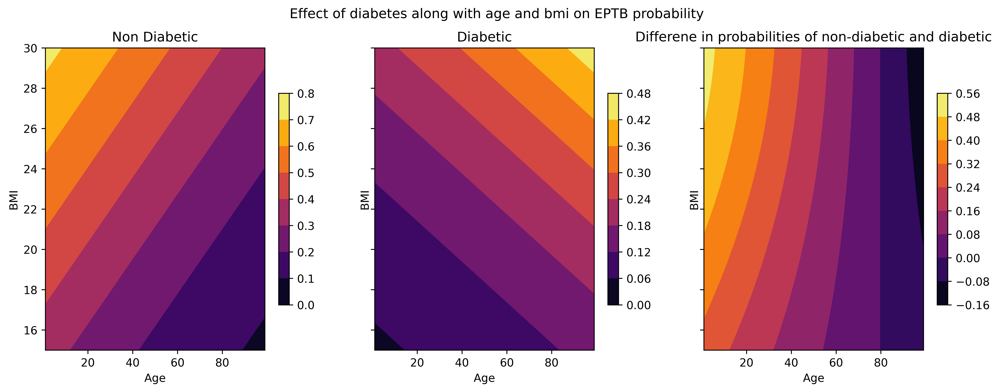

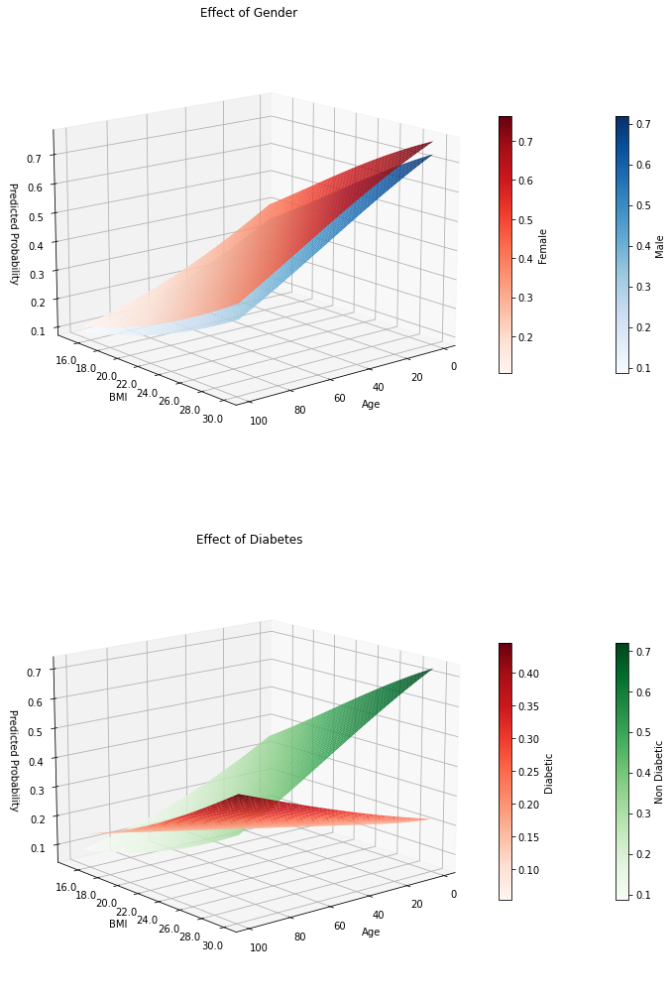

In [24]:
_df = working_df.loc[:, ['ep', 'Age', 'Gender', 'bmi', 'dm', 'hiv',]].dropna()
result = smf.logit('ep ~ Age + Gender + bmi + dm + hiv + Age:dm ', _df).fit()
# result_plot = sm.Logit(_df.ep, sm.add_constant(_df.loc[:,['Age', 'Gender', 'bmi', 'dm', 'hiv']]), missing = 'drop', ).fit()
display(result.summary2())
# display(result.conf_int)
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Odds ratios and confidence intervals')
display(np.exp(result.params))
display(np.exp(result.conf_int()))
marg_eff = result.get_margeff(at = 'overall', method = 'dydx')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
display(marg_eff.summary())
plot_regression(result)
plot_regression_3d(result)
# warnings.filterwarnings('ignore')

Checking if one model is better than other

In [ ]:
stats.ttest_ind(interaction_result.resid_response, no_interaction_result.resid_response)

Ttest_indResult(statistic=-2.7824739166187368e-15, pvalue=0.9999999999999978)

## Now applying the same model and inferences on each EPTB disease separately

This is without interaction

Optimization terminated successfully.
         Current function value: 0.226158
         Iterations 8


'Abdominal'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.073     
Dependent Variable: ep               AIC:              855.3773  
Date:               2022-10-13 15:01 BIC:              883.0431  
No. Observations:   1869             Log-Likelihood:   -422.69   
Df Model:           4                LL-Null:          -456.19   
Df Residuals:       1864             LLR p-value:      9.7434e-14
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     8.0000                                       
------------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept     -2.6059    0.4521  -5.7641  0.0000  -3.4920  -1.7198
Age           -0.0337    0.0063  -5.3134  0.0000  -0.0462  -0.0213
Gender         0.4546    0.1933   2.3513  0.0187   0.0757   0.8335
bmi            0.0592    0.0215   2.7496  0.0060   0.0170   0.1013
dm            -1.0444    0.4340  -2.4064  0.0161  -1.8950  -0.1937
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.073837
Age          0.966846
Gender       1.575529
bmi          1.060952
dm           0.351913
dtype: float64

,0,1
Intercept,0.030441,0.179100
Age,0.954896,0.978946
Gender,1.078599,2.301403
bmi,1.017136,1.106655
dm,0.150319,0.823866


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0020      0.000     -5.073      0.000      -0.003      -0.001
Gender         0.0271      0.012      2.333      0.020       0.004       0.050
bmi            0.0035      0.001      2.721      0.007       0.001       0.006
dm            -0.0623      0.026     -2.378      0.017      -0.114      -0.011
==============================================================================
"""

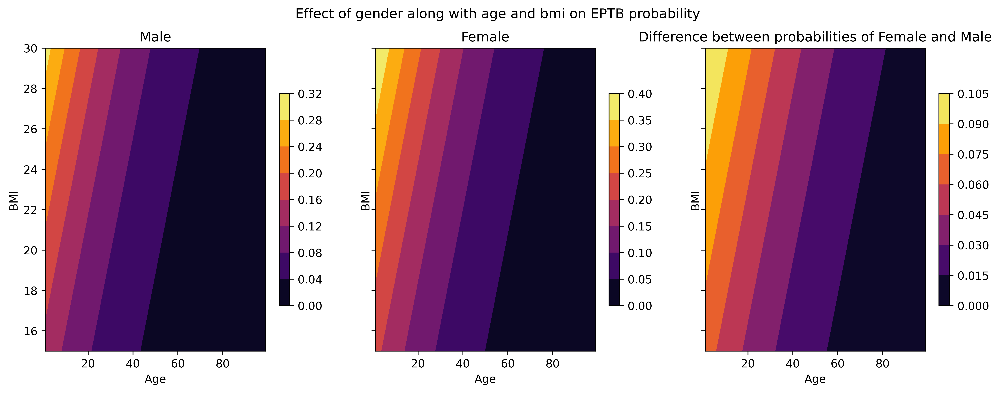

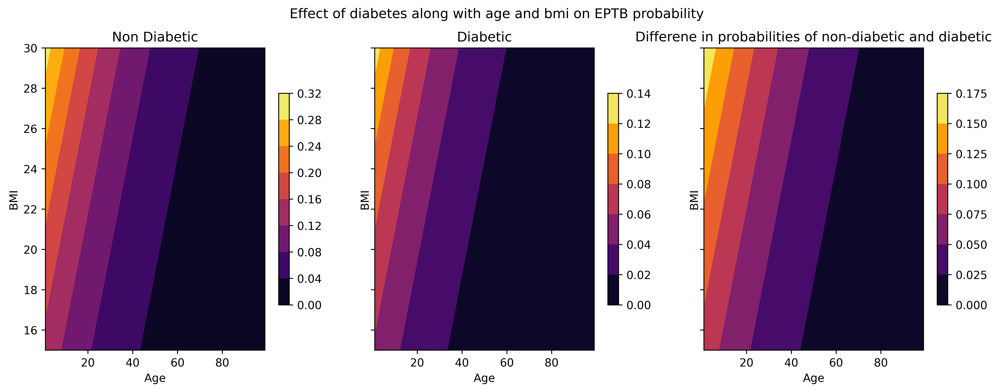

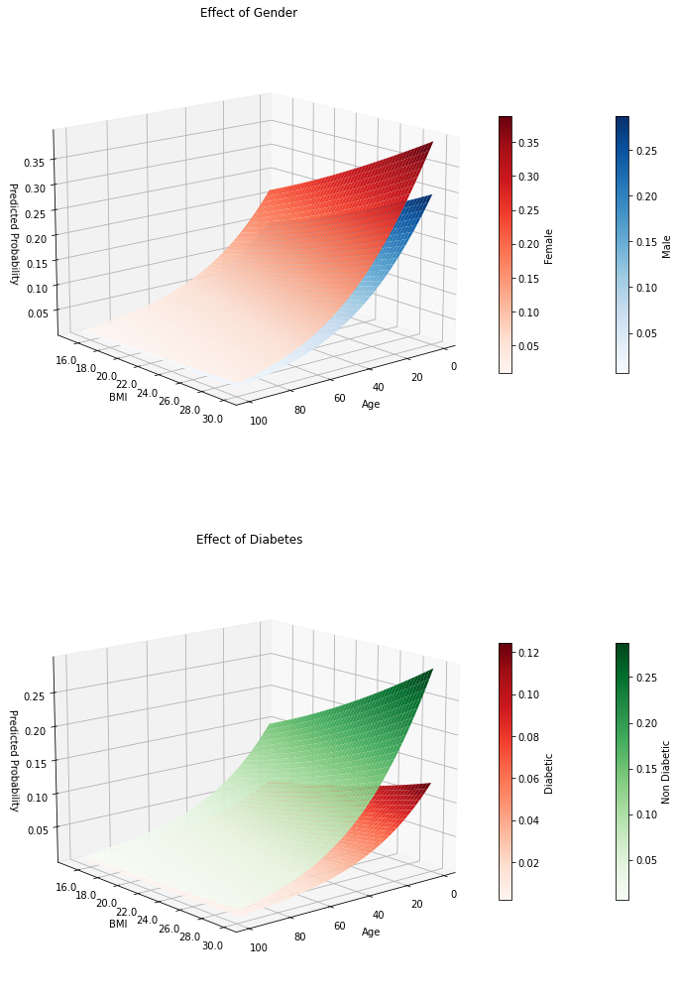

Optimization terminated successfully.
         Current function value: 0.357745
         Iterations 6


'Pleural'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.034     
Dependent Variable: ep               AIC:              1431.6801 
Date:               2022-10-13 15:01 BIC:              1459.6520 
No. Observations:   1987             Log-Likelihood:   -710.84   
Df Model:           4                LL-Null:          -736.14   
Df Residuals:       1982             LLR p-value:      2.6984e-10
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     6.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept    -3.7598    0.3472  -10.8280  0.0000  -4.4403  -3.0792
Age          -0.0015    0.0040   -0.3875  0.6984  -0.0094   0.0063
Gender       -0.1856    0.1497   -1.2399  0.2150  -0.4791   0.1078
bmi           0.1043    0.0155    6.7307  0.0000   0.0739   0.1347
dm           -0.6760    0.2247   -3.0082  0.0026  -1.1165  -0.2356
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.023289
Age          0.998456
Gender       0.830580
bmi          1.109960
dm           0.508632
dtype: float64

,0,1
Intercept,0.011792,0.045995
Age,0.990682,1.006291
Gender,0.619363,1.113825
bmi,1.076748,1.144197
dm,0.327425,0.790125


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0002      0.000     -0.388      0.698      -0.001       0.001
Gender        -0.0193      0.016     -1.239      0.215      -0.050       0.011
bmi            0.0108      0.002      6.727      0.000       0.008       0.014
dm            -0.0702      0.023     -3.002      0.003      -0.116      -0.024
==============================================================================
"""

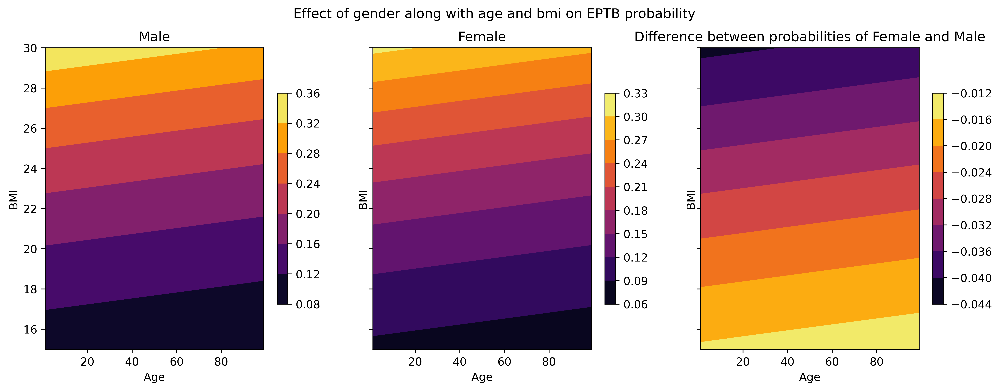

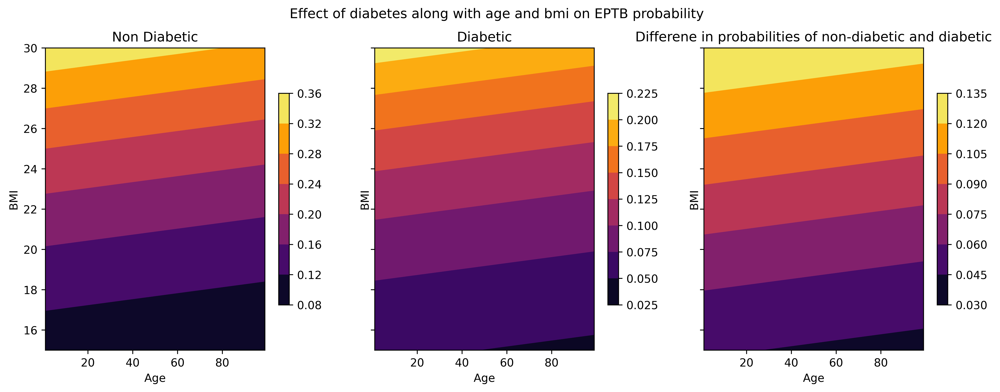

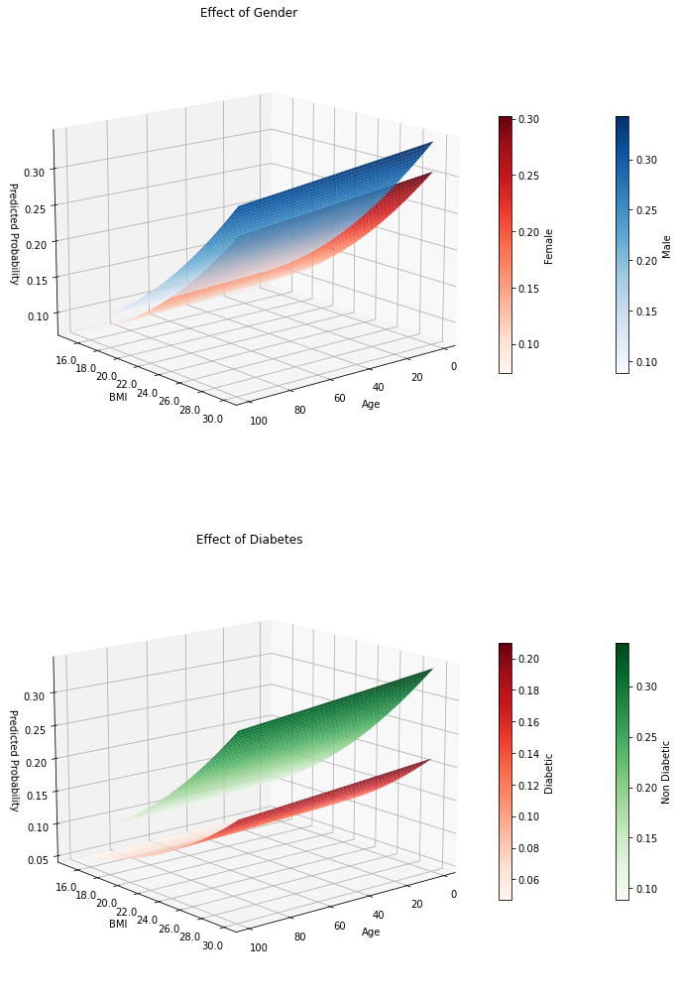

Optimization terminated successfully.
         Current function value: 0.178310
         Iterations 7


'Spinal'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.082     
Dependent Variable: ep               AIC:              664.0411  
Date:               2022-10-13 15:02 BIC:              691.6123  
No. Observations:   1834             Log-Likelihood:   -327.02   
Df Model:           4                LL-Null:          -356.08   
Df Residuals:       1829             LLR p-value:      7.1717e-12
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     7.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept    -5.7784    0.5157  -11.2043  0.0000  -6.7892  -4.7676
Age          -0.0089    0.0067   -1.3339  0.1822  -0.0220   0.0042
Gender        0.0795    0.2304    0.3449  0.7302  -0.3721   0.5310
bmi           0.1606    0.0211    7.6076  0.0000   0.1192   0.2020
dm           -0.4621    0.3343   -1.3823  0.1669  -1.1173   0.1931
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.003094
Age          0.991128
Gender       1.082696
bmi          1.174199
dm           0.629959
dtype: float64

,0,1
Intercept,0.001126,0.008501
Age,0.978234,1.004191
Gender,0.689273,1.700676
bmi,1.126611,1.223797
dm,0.327162,1.213000


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0004      0.000     -1.327      0.184      -0.001       0.000
Gender         0.0035      0.010      0.345      0.730      -0.016       0.023
bmi            0.0070      0.001      6.792      0.000       0.005       0.009
dm            -0.0202      0.015     -1.376      0.169      -0.049       0.009
==============================================================================
"""

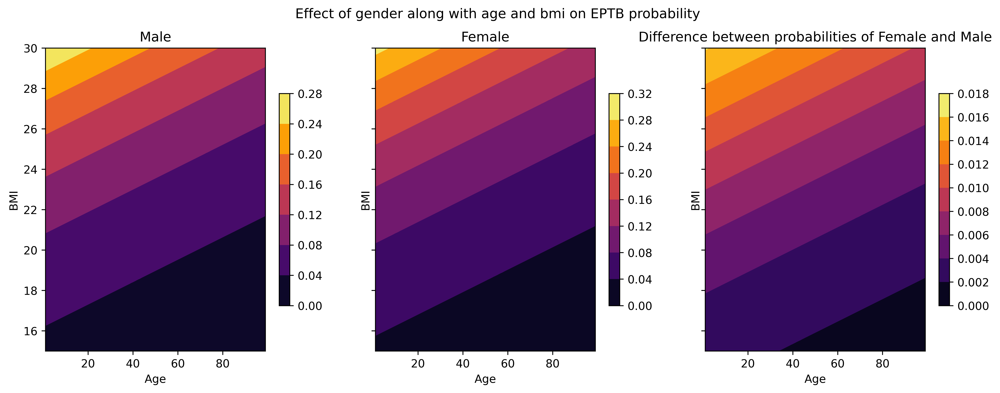

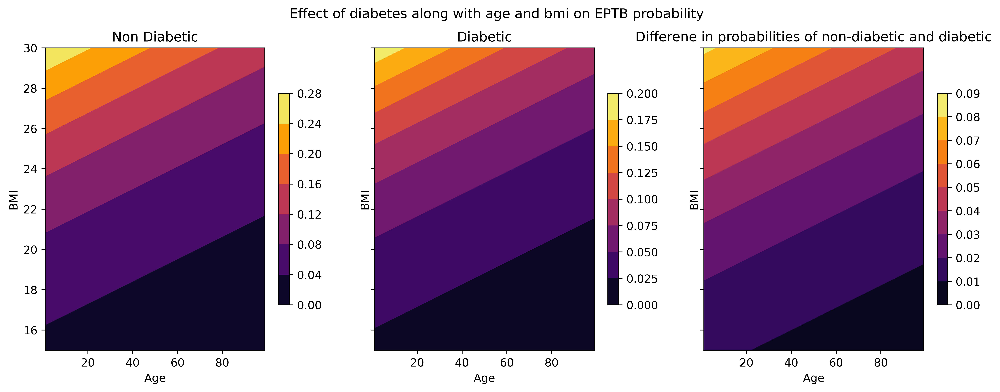

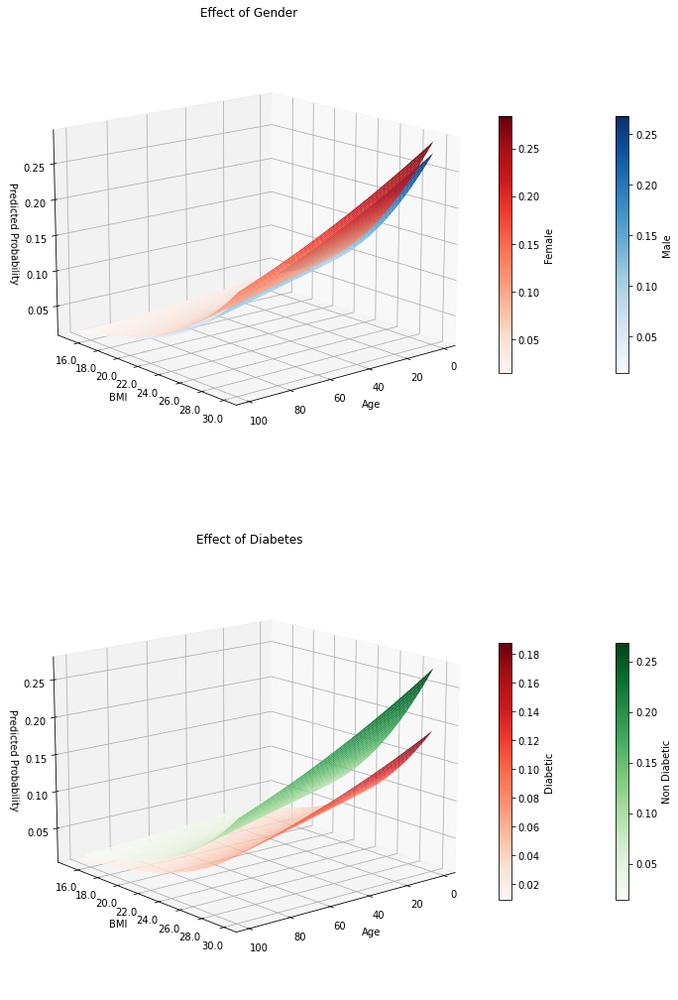

Optimization terminated successfully.
         Current function value: 0.234843
         Iterations 9


'Lymph Node'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.136     
Dependent Variable: ep               AIC:              898.1749  
Date:               2022-10-13 15:02 BIC:              925.8992  
No. Observations:   1891             Log-Likelihood:   -444.09   
Df Model:           4                LL-Null:          -514.16   
Df Residuals:       1886             LLR p-value:      2.6380e-29
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     9.0000                                       
------------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept     -3.7859    0.4211  -8.9901  0.0000  -4.6113  -2.9605
Age           -0.0341    0.0061  -5.6081  0.0000  -0.0460  -0.0222
Gender         0.7162    0.1858   3.8545  0.0001   0.3520   1.0803
bmi            0.1214    0.0187   6.4889  0.0000   0.0847   0.1581
dm            -2.0521    0.5973  -3.4355  0.0006  -3.2229  -0.8814
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.022689
Age          0.966506
Gender       2.046591
bmi          1.129089
dm           0.128461
dtype: float64

,0,1
Intercept,0.009939,0.051792
Age,0.955066,0.978082
Gender,1.421926,2.945678
bmi,1.088432,1.171263
dm,0.039840,0.414216


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0022      0.000     -5.473      0.000      -0.003      -0.001
Gender         0.0464      0.012      3.822      0.000       0.023       0.070
bmi            0.0079      0.001      6.430      0.000       0.005       0.010
dm            -0.1329      0.039     -3.383      0.001      -0.210      -0.056
==============================================================================
"""

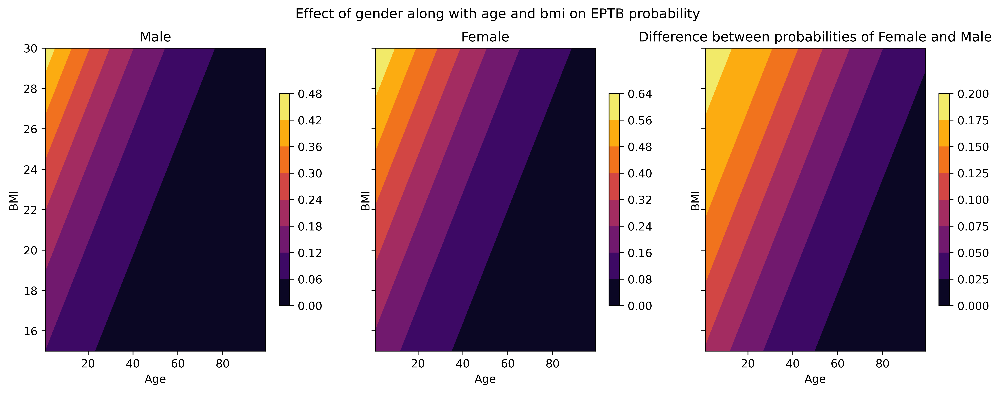

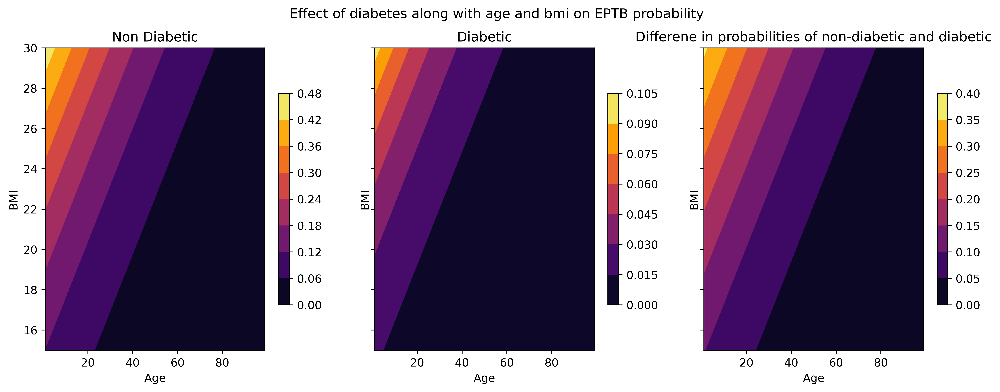

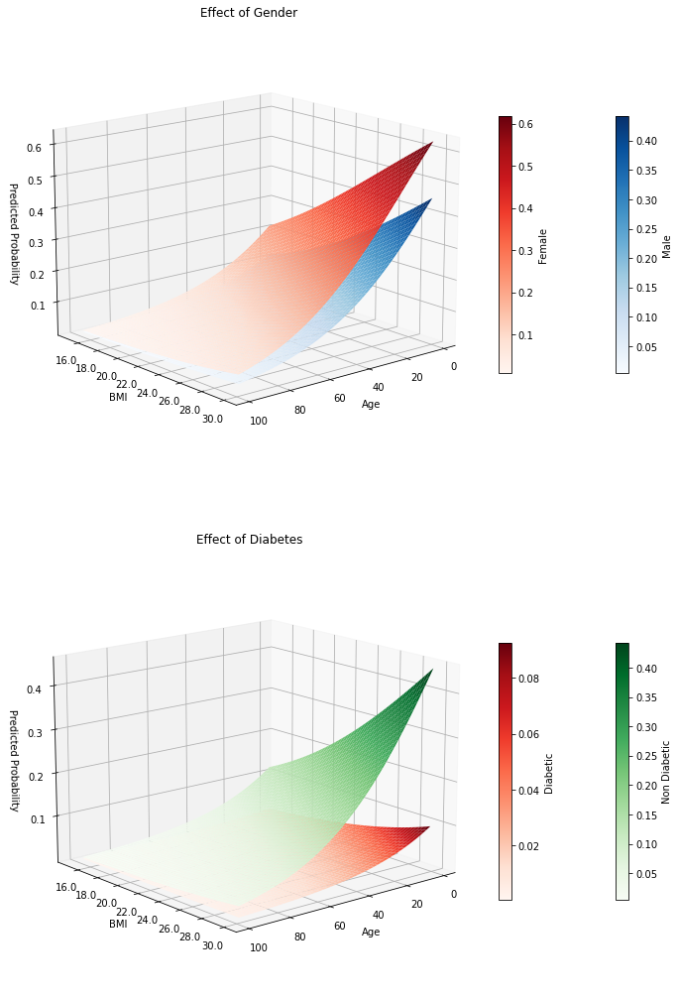

In [25]:
for path in EP_SITES:
  _df = working_df[working_df.EPSite == path]
  _df = pd.concat((p_df, _df), axis = 0)
  _df = _df.loc[:, ['ep', 'Age', 'Gender', 'bmi', 'dm', 'hiv']].dropna()
  result = smf.logit('ep ~ Age + Gender + bmi + dm', _df).fit()
  # result_plot = sm.Logit(_df.ep, sm.add_constant(_df.loc[:,['Age', 'Gender', 'bmi', 'dm']]), missing = 'drop', ).fit()
  display(path)
  print('+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  display(result.summary2())
  # display(result.conf_int)
  print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  print('Odds ratios and confidence intervals')
  display(np.exp(result.params))
  display(np.exp(result.conf_int()))
  marg_eff = result.get_margeff(at = 'overall', method = 'dydx')
  print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  display(marg_eff.summary())
  plot_regression(result)
  plot_regression_3d(result)
  # warnings.filterwarnings('ignore')

This is with ineraction

Optimization terminated successfully.
         Current function value: 0.225202
         Iterations 8


'Abdominal'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.077     
Dependent Variable: ep               AIC:              853.8037  
Date:               2022-10-13 15:03 BIC:              887.0026  
No. Observations:   1869             Log-Likelihood:   -420.90   
Df Model:           5                LL-Null:          -456.19   
Df Residuals:       1863             LLR p-value:      7.7803e-14
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     8.0000                                       
------------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept     -2.5183    0.4559  -5.5237  0.0000  -3.4118  -1.6247
Age           -0.0365    0.0066  -5.4946  0.0000  -0.0495  -0.0235
Gender         0.4387    0.1937   2.2654  0.0235   0.0592   0.8183
bmi            0.0596    0.0216   2.7608  0.0058   0.0173   0.1019
dm            -3.7690    1.6994  -2.2179  0.0266  -7.0996  -0.4383
Age:dm         0.0556    0.0303   1.8344  0.0666  -0.0038   0.1151
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.080598
Age          0.964151
Gender       1.550724
bmi          1.061422
dm           0.023076
Age:dm       1.057220
dtype: float64

,0,1
Intercept,0.032980,0.196966
Age,0.951676,0.976789
Gender,1.060938,2.266621
bmi,1.017441,1.107304
dm,0.000825,0.645151
Age:dm,0.996198,1.121981


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0022      0.000     -5.238      0.000      -0.003      -0.001
Gender         0.0261      0.012      2.250      0.024       0.003       0.049
bmi            0.0035      0.001      2.733      0.006       0.001       0.006
dm            -0.2241      0.102     -2.196      0.028      -0.424      -0.024
Age:dm         0.0033      0.002      1.822      0.068      -0.000       0.007
==============================================================================
"""

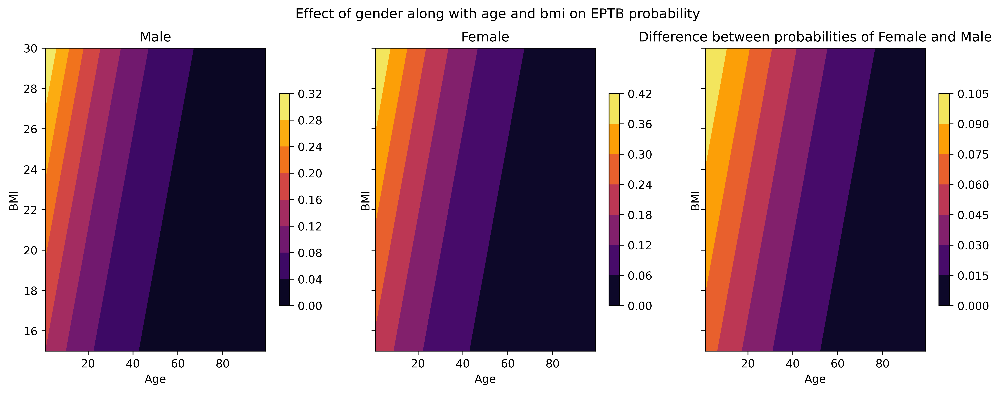

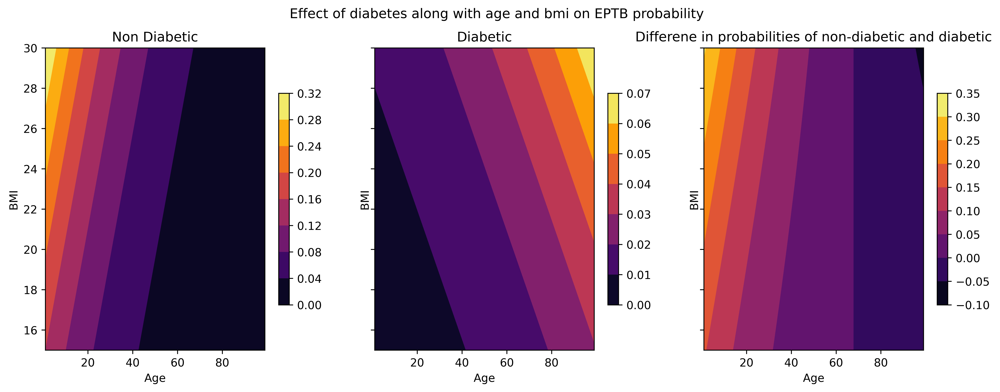

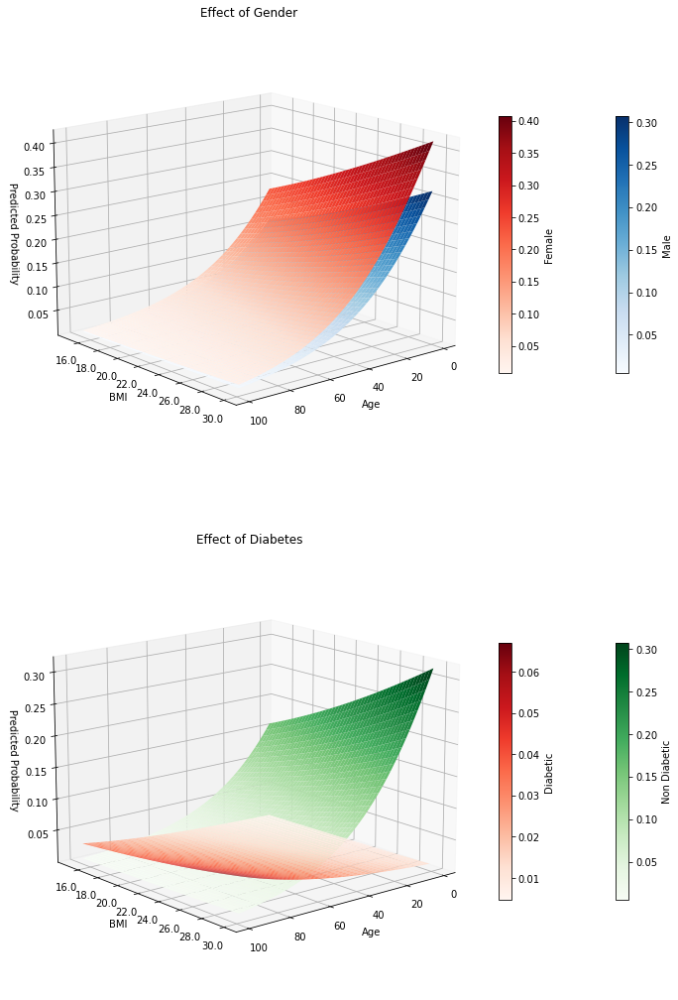

Optimization terminated successfully.
         Current function value: 0.357653
         Iterations 7


'Pleural'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.035     
Dependent Variable: ep               AIC:              1433.3119 
Date:               2022-10-13 15:03 BIC:              1466.8782 
No. Observations:   1987             Log-Likelihood:   -710.66   
Df Model:           5                LL-Null:          -736.14   
Df Residuals:       1981             LLR p-value:      8.7554e-10
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     7.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept    -3.7284    0.3508  -10.6275  0.0000  -4.4160  -3.0408
Age          -0.0022    0.0042   -0.5363  0.5917  -0.0104   0.0059
Gender       -0.1892    0.1498   -1.2627  0.2067  -0.4828   0.1045
bmi           0.1042    0.0155    6.7220  0.0000   0.0738   0.1346
dm           -1.1529    0.8307   -1.3879  0.1652  -2.7810   0.4752
Age:dm        0.0093    0.0154    0.6042  0.5457  -0.0209   0.0395
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.024032
Age          0.997777
Gender       0.827637
bmi          1.109837
dm           0.315722
Age:dm       1.009353
dtype: float64

,0,1
Intercept,0.012083,0.047798
Age,0.989694,1.005926
Gender,0.617035,1.110121
bmi,1.076621,1.144078
dm,0.061974,1.608408
Age:dm,0.979328,1.040299


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0002      0.000     -0.536      0.592      -0.001       0.001
Gender        -0.0197      0.016     -1.262      0.207      -0.050       0.011
bmi            0.0108      0.002      6.718      0.000       0.008       0.014
dm            -0.1198      0.086     -1.387      0.165      -0.289       0.049
Age:dm         0.0010      0.002      0.604      0.546      -0.002       0.004
==============================================================================
"""

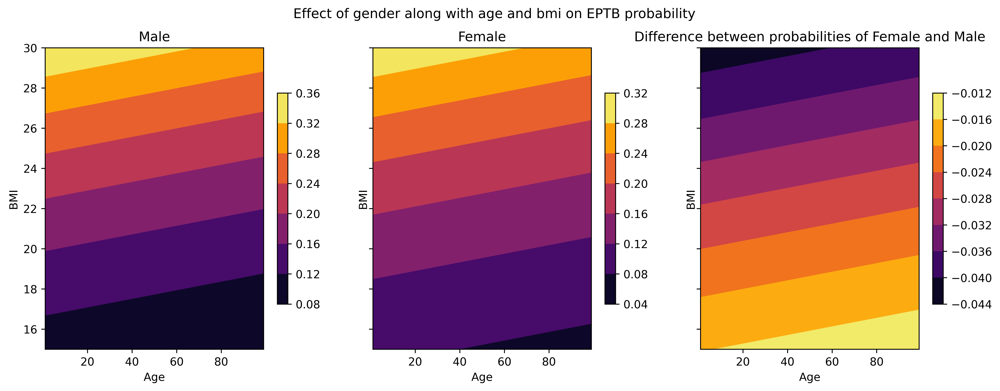

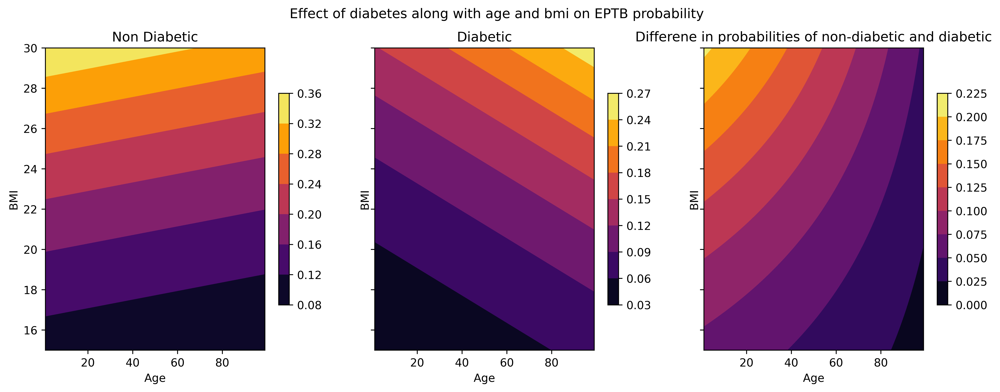

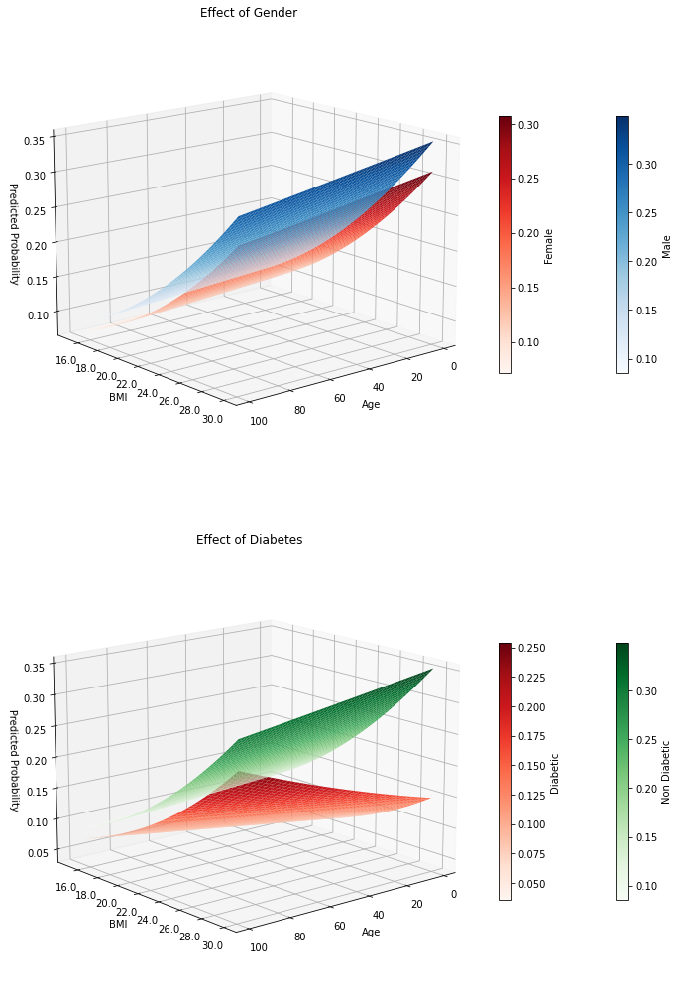

Optimization terminated successfully.
         Current function value: 0.177546
         Iterations 8


'Spinal'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.086     
Dependent Variable: ep               AIC:              663.2405  
Date:               2022-10-13 15:04 BIC:              696.3260  
No. Observations:   1834             Log-Likelihood:   -325.62   
Df Model:           5                LL-Null:          -356.08   
Df Residuals:       1828             LLR p-value:      7.8108e-12
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     8.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept    -5.6557    0.5206  -10.8643  0.0000  -6.6760  -4.6354
Age          -0.0125    0.0071   -1.7559  0.0791  -0.0265   0.0015
Gender        0.0632    0.2306    0.2739  0.7842  -0.3888   0.5151
bmi           0.1617    0.0212    7.6284  0.0000   0.1202   0.2032
dm           -2.5214    1.3699   -1.8406  0.0657  -5.2065   0.1636
Age:dm        0.0396    0.0242    1.6327  0.1025  -0.0079   0.0871
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.003498
Age          0.987557
Gender       1.065197
bmi          1.175506
dm           0.080343
Age:dm       1.040383
dtype: float64

,0,1
Intercept,0.001261,0.009703
Age,0.973850,1.001456
Gender,0.677862,1.673859
bmi,1.127670,1.225371
dm,0.005481,1.177731
Age:dm,0.992096,1.091021


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0005      0.000     -1.740      0.082      -0.001    6.92e-05
Gender         0.0028      0.010      0.274      0.784      -0.017       0.023
bmi            0.0071      0.001      6.814      0.000       0.005       0.009
dm            -0.1103      0.061     -1.822      0.068      -0.229       0.008
Age:dm         0.0017      0.001      1.619      0.105      -0.000       0.004
==============================================================================
"""

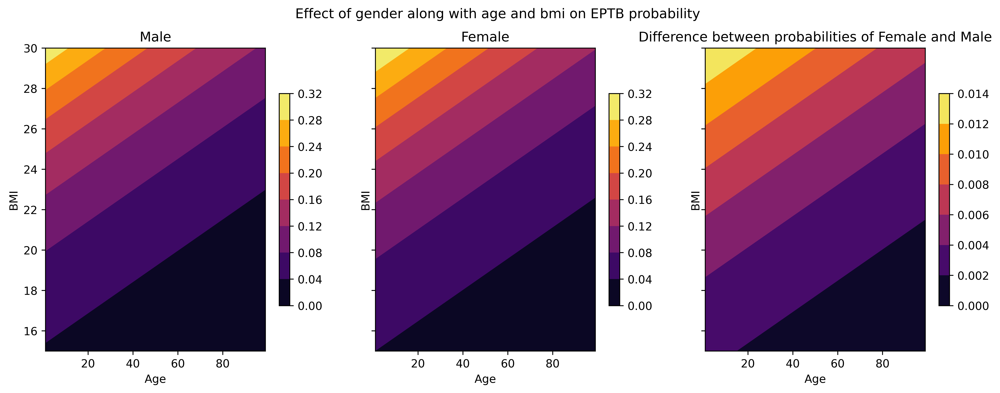

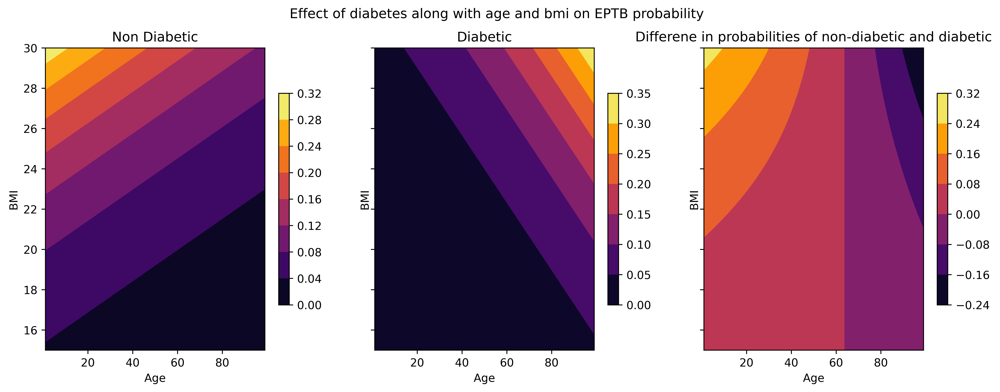

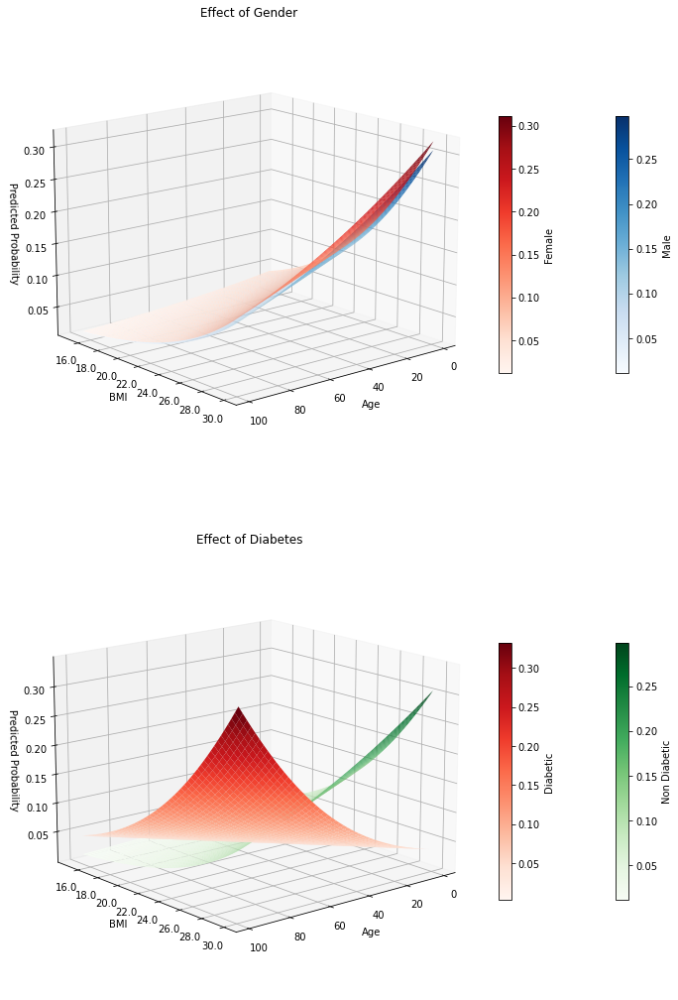

Optimization terminated successfully.
         Current function value: 0.234790
         Iterations 9


'Lymph Node'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.136     
Dependent Variable: ep               AIC:              899.9745  
Date:               2022-10-13 15:04 BIC:              933.2437  
No. Observations:   1891             Log-Likelihood:   -443.99   
Df Model:           5                LL-Null:          -514.16   
Df Residuals:       1885             LLR p-value:      1.5167e-28
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     9.0000                                       
------------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
------------------------------------------------------------------
Intercept     -3.7728    0.4223  -8.9339  0.0000  -4.6005  -2.9451
Age           -0.0345    0.0062  -5.5985  0.0000  -0.0465  -0.0224
Gender         0.7144    0.1859   3.8437  0.0001   0.3501   1.0787
bmi            0.1214    0.0187   6.4860  0.0000   0.0847   0.1581
dm            -2.9206    2.1016  -1.3897  0.1646  -7.0397   1.1985
Age:dm         0.0187    0.0419   0.4472  0.6547  -0.0634   0.1009
=================================================================

"""

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Odds ratios and confidence intervals


Intercept    0.022988
Age          0.966124
Gender       2.042999
bmi          1.129115
dm           0.053901
Age:dm       1.018926
dtype: float64

,0,1
Intercept,0.010047,0.052597
Age,0.954538,0.977851
Gender,1.419246,2.940888
bmi,1.088432,1.171318
dm,0.000876,3.315295
Age:dm,0.938547,1.106189


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:                     ep
Method:                          dydx
At:                           overall
==============================================================================
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Age           -0.0022      0.000     -5.468      0.000      -0.003      -0.001
Gender         0.0462      0.012      3.811      0.000       0.022       0.070
bmi            0.0079      0.001      6.428      0.000       0.005       0.010
dm            -0.1890      0.136     -1.387      0.165      -0.456       0.078
Age:dm         0.0012      0.003      0.447      0.655      -0.004       0.007
==============================================================================
"""

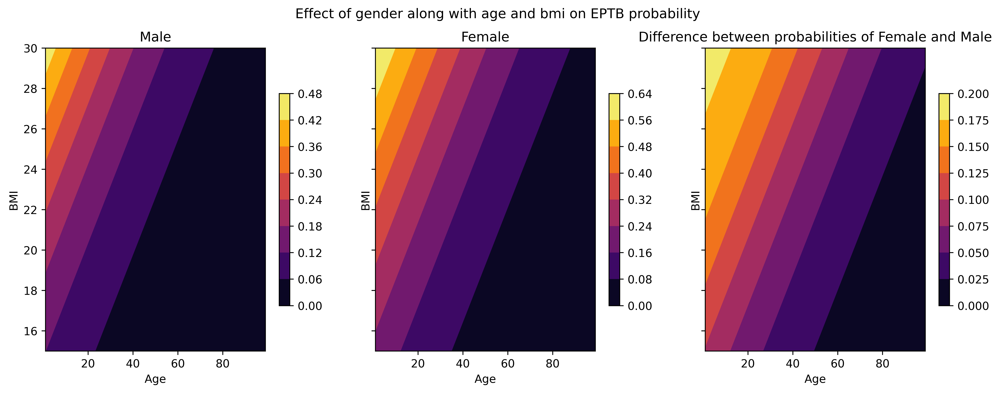

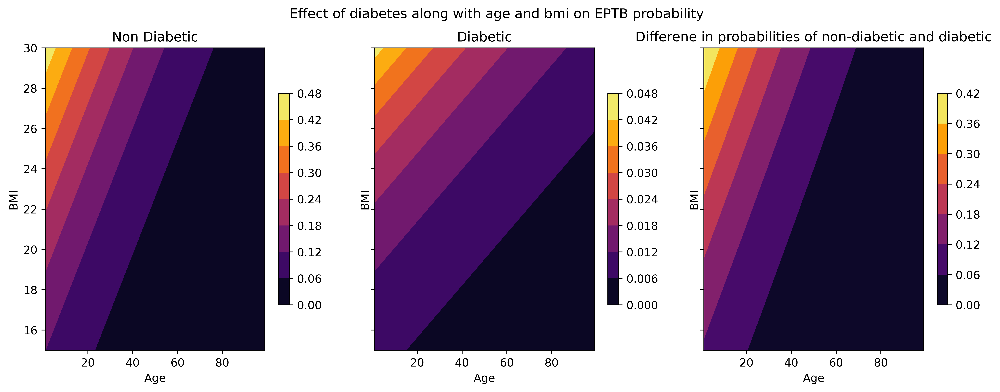

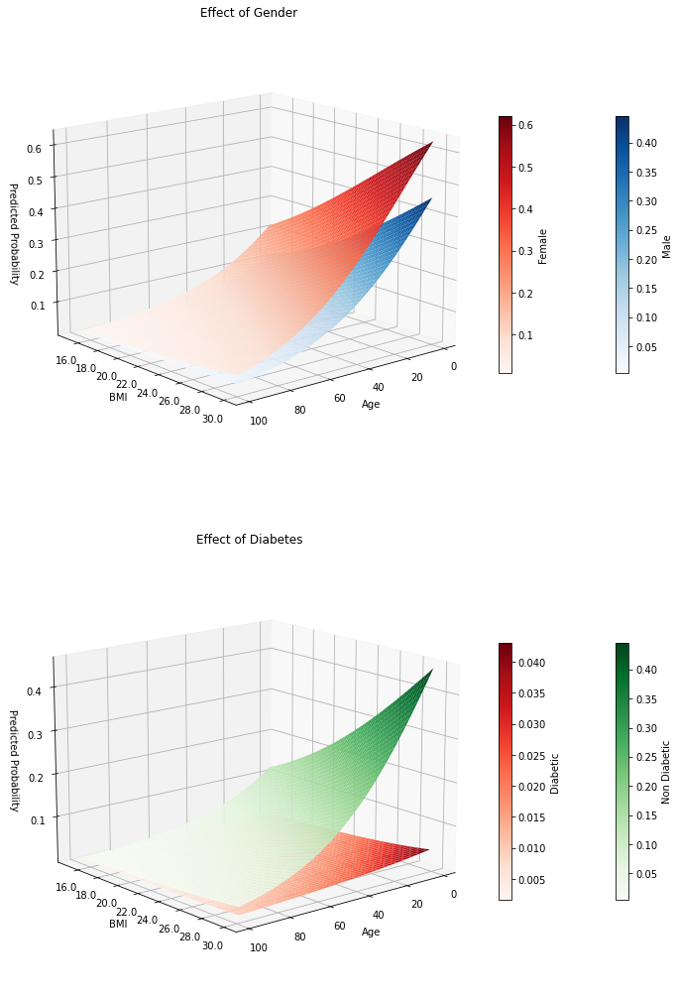

In [26]:
for path in EP_SITES:
  _df = working_df[working_df.EPSite == path]
  _df = pd.concat((p_df, _df), axis = 0)
  _df = _df.loc[:, ['ep', 'Age', 'Gender', 'bmi', 'dm', 'hiv']].dropna()
  result = smf.logit('ep ~ Age + Gender + bmi + dm + Age:dm', _df).fit()
  # result_plot = sm.Logit(_df.ep, sm.add_constant(_df.loc[:,['Age', 'Gender', 'bmi', 'dm']]), missing = 'drop', ).fit()
  display(path)
  print('+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  display(result.summary2())
  # display(result.conf_int)
  print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  print('Odds ratios and confidence intervals')
  display(np.exp(result.params))
  display(np.exp(result.conf_int()))
  marg_eff = result.get_margeff(at = 'overall', method = 'dydx')
  print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  display(marg_eff.summary())
  plot_regression(result)
  plot_regression_3d(result)
  # warnings.filterwarnings('ignore')